#### **Advancing Skin Disease Detection: Precision Classification for Effective Diagnosis**

HAM10000 DATASET

HAM10000 ("Human Against Machine with 10000 training images"), is a dataset created by 
https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/DBW86T
[1] Noel Codella, Veronica Rotemberg, Philipp Tschandl, M. Emre Celebi, Stephen Dusza, David Gutman, Brian Helba, Aadi Kalloo, Konstantinos Liopyris, Michael Marchetti, Harald Kittler, Allan Halpern: “Skin Lesion Analysis Toward Melanoma Detection 2018: A Challenge Hosted by the International Skin Imaging Collaboration (ISIC)”, 2018; https://arxiv.org/abs/1902.03368
[2] Tschandl, P., Rosendahl, C. & Kittler, H. The HAM10000 dataset, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. Sci. Data 5, 180161 doi:10.1038/sdata.2018.161 (2018).

The dataset consists of dermatoscopic images, that is acquired from a diverse population. The dataset has 10 015 images, and the images are divided into: 
* HAM10000_images_part1.zip (5000 JPEG files)
* HAM10000_images_part2.zip (5015 JPEG files)

There are approximately 3000 to 5000 different skin conditions, but the dataset only includes:
*  Actinic keratoses and intraepithelial carcinoma / Bowen's disease (akiec)
*  basal cell carcinoma (bcc)
*  benign keratosis-like lesions (solar lentigines / seborrheic keratoses and lichen-planus like keratoses, bkl)
*  dermatofibroma (df)
*  melanoma (mel)
*  melanocytic nevi (nv)
*  vascular lesions (angiomas, angiokeratomas, pyogenic granulomas and hemorrhage, vasc)


But are shortened to:
* Melanocytic nevi
* Melanoma
* Benign keratosis-like lesions
* Basal cell carcinoma
* Actinic keratoses
* Vascular lesions
* Dermatofibroma


The meta-data includes important factors that may influence the results, such as the patients' age, and sex.  The region in which the disease is located is also revealed in the meta-data.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-disease-samples1/Samples/Sample_meta-data.csv
/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_50031633.jpg
/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_10027419.jpg
/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_30026769.jpg
/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_40025661.jpeg
/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_20025030.jpg
/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_70029176.jpg
/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_60027850.jpg
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028933.jpg
/kaggle/input/skin

# Import Important libraries

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

2024-09-09 01:06:57.074444: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-09 01:06:57.074578: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-09 01:06:57.242830: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Import datasets

# hmnist Dataset

The hmnist csv folders are all pixel descriptions and the L has fewer columns than the RGB folder

In [3]:
hmnist_28_L=pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_L.csv')
hmnist_28_L

,pixel0000,pixel0001,pixel0002,pixel0003,pixel0004,pixel0005,pixel0006,pixel0007,pixel0008,pixel0009,...,pixel0775,pixel0776,pixel0777,pixel0778,pixel0779,pixel0780,pixel0781,pixel0782,pixel0783,label
0,169,171,170,177,181,182,181,185,194,192,...,184,186,185,180,157,140,140,159,165,2
1,19,57,105,140,149,148,144,155,170,170,...,172,175,160,144,114,89,47,18,18,2
2,155,163,161,167,167,172,155,152,165,175,...,163,178,157,166,167,148,141,136,115,2
3,25,71,116,139,136,153,148,161,172,162,...,125,135,138,137,111,71,32,16,16,2
4,129,162,181,196,205,208,205,213,225,224,...,210,197,172,190,195,193,181,147,88,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10010,172,171,173,175,164,187,207,210,208,206,...,210,217,221,209,185,187,192,192,192,0
10011,2,34,108,116,114,119,131,139,139,145,...,173,169,168,168,143,138,83,23,3,0
10012,122,154,162,170,179,197,200,195,202,199,...,221,215,205,187,209,198,187,164,156,0
10013,137,143,141,139,147,152,155,152,155,159,...,172,171,175,183,177,170,169,166,170,0


In [4]:
hmnist_28_RGB=pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_RGB.csv')
hmnist_28_RGB

,pixel0000,pixel0001,pixel0002,pixel0003,pixel0004,pixel0005,pixel0006,pixel0007,pixel0008,pixel0009,...,pixel2343,pixel2344,pixel2345,pixel2346,pixel2347,pixel2348,pixel2349,pixel2350,pixel2351,label
0,192,153,193,195,155,192,197,154,185,202,...,173,124,138,183,147,166,185,154,177,2
1,25,14,30,68,48,75,123,93,126,158,...,60,39,55,25,14,28,25,14,27,2
2,192,138,153,200,145,163,201,142,160,206,...,167,129,143,159,124,142,136,104,117,2
3,38,19,30,95,59,72,143,103,119,171,...,44,26,36,25,12,17,25,12,15,2
4,158,113,139,194,144,174,215,162,191,225,...,209,166,185,172,135,149,109,78,92,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10010,183,165,181,182,165,180,184,166,182,188,...,208,185,187,208,186,186,206,187,189,0
10011,2,3,1,38,33,32,121,104,103,132,...,96,79,76,24,23,21,3,4,1,0
10012,132,118,118,167,149,149,175,156,160,184,...,204,181,178,181,159,153,172,151,145,0
10013,160,124,146,164,131,152,167,127,146,169,...,185,162,167,184,157,166,185,162,172,0


# Meta-data

In [5]:
meta_data=pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')
meta_data

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear
...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face


In [6]:
meta_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB


There are 10 015 entries, and 7 columns.  

The age column has fewer entries than all the other columns

In [7]:
unique_counts = meta_data.nunique()

print("\nUnique entries in each column:")
print(unique_counts)


Unique entries in each column:
lesion_id        7470
image_id        10015
dx                  7
dx_type             4
age                18
sex                 3
localization       15
dtype: int64


In [8]:
meta_data['sex'].unique()

array(['male', 'female', 'unknown'], dtype=object)

In [9]:
meta_data['localization'].unique()

array(['scalp', 'ear', 'face', 'back', 'trunk', 'chest',
       'upper extremity', 'abdomen', 'unknown', 'lower extremity',
       'genital', 'neck', 'hand', 'foot', 'acral'], dtype=object)

# Column description

* The lesion_id, has 7470 unique entries, this implies that there exist repetitive lesion_ids, because the dataset includes lesions with multiple images
* The image_id has 10 015 entries, this concludes that each image has a specific id. 
* The participants in the dataset belong to 18 different ages, and 3 different sexes, male female, and unknown. 
* The region of the disease is located in 15 different locations, this diversifies the dataset.  The locations are:
scalp, ear, face, back, trunk, chest,upper extremity, abdomen, unknown, lower extremity,genital,neck, hand, foot, acral

# Explaratory Data Analysis

In [10]:
meta_data.describe(include='all')

,lesion_id,image_id,dx,dx_type,age,sex,localization
count,10015,10015,10015,10015,9958.000000,10015,10015
unique,7470,10015,7,4,NaN,3,15
top,HAM_0003789,ISIC_0032258,nv,histo,NaN,male,back
freq,6,1,6705,5340,NaN,5406,2192
mean,NaN,NaN,NaN,NaN,51.863828,NaN,NaN
std,NaN,NaN,NaN,NaN,16.968614,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
25%,NaN,NaN,NaN,NaN,40.000000,NaN,NaN
50%,NaN,NaN,NaN,NaN,50.000000,NaN,NaN
75%,NaN,NaN,NaN,NaN,65.000000,NaN,NaN


Most of the columns in the dataset are categorical, so finding statistical analysis of these columns is difficult

In [11]:
print(meta_data.isnull().sum())

lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
dtype: int64


Age is the only column with null entries

lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
dtype: int64


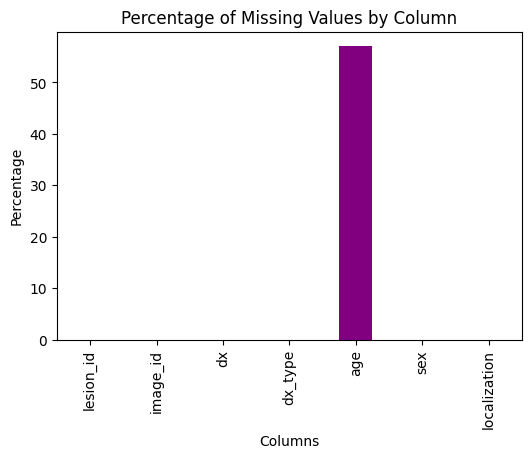

In [12]:
missing_values = meta_data.isnull().sum()
print(missing_values)
missing_values_percentage = (missing_values)
plt.figure(figsize=(6, 4))
missing_values_percentage.plot(kind='bar', color='purple')
plt.title('Percentage of Missing Values by Column')
plt.ylabel('Percentage')
plt.xlabel('Columns')
plt.show()

In [13]:
categorical_columns = ['lesion_id', 'image_id', 'dx', 'dx_type', 'sex', 'localization']
numerical_columns = ['age']

In [14]:
for column in categorical_columns:
    meta_data['localization'].value_counts()
    
meta_data['localization'].value_counts()

localization
back               2192
lower extremity    2077
trunk              1404
upper extremity    1118
abdomen            1022
face                745
chest               407
foot                319
unknown             234
neck                168
scalp               128
hand                 90
ear                  56
genital              48
acral                 7
Name: count, dtype: int64

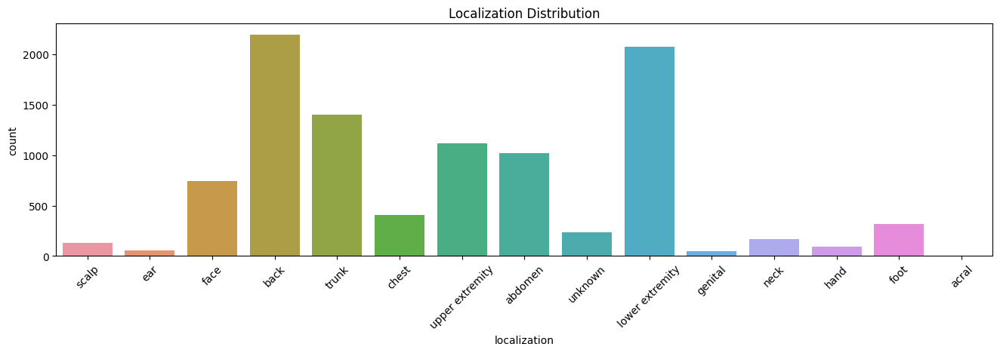

In [15]:
plt.figure(figsize=(16, 4))
sns.countplot(data=meta_data, x='localization')
plt.title('Localization Distribution')
plt.xticks(rotation=45)
plt.show()

Majority of the skin conditions that exist in the dataset are located on the back

In [16]:
for column in categorical_columns:
    meta_data['sex'].value_counts()
    
meta_data['sex'].value_counts()

sex
male       5406
female     4552
unknown      57
Name: count, dtype: int64

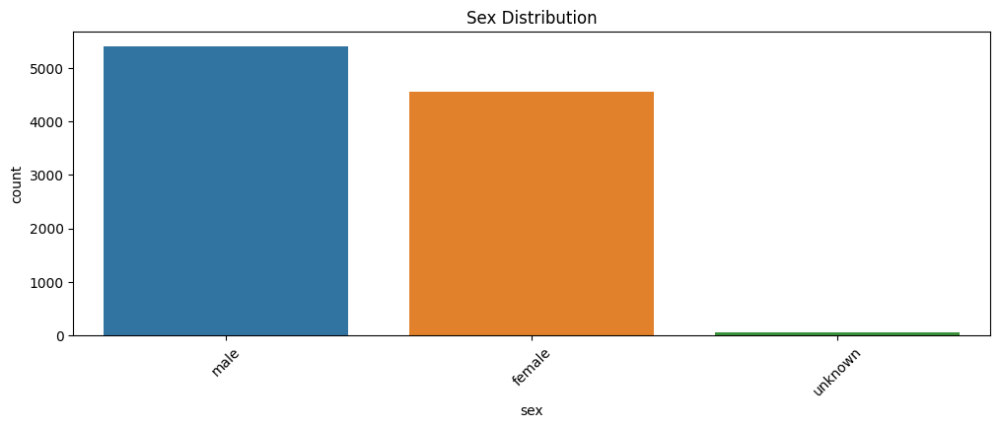

In [17]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='sex')
plt.title('Sex Distribution')
plt.xticks(rotation=45)
plt.show()

There are more males in the dataset, than females, and unknown gender

In [18]:
for column in categorical_columns:
    meta_data['dx'].value_counts()
    
meta_data['dx'].value_counts()

dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64

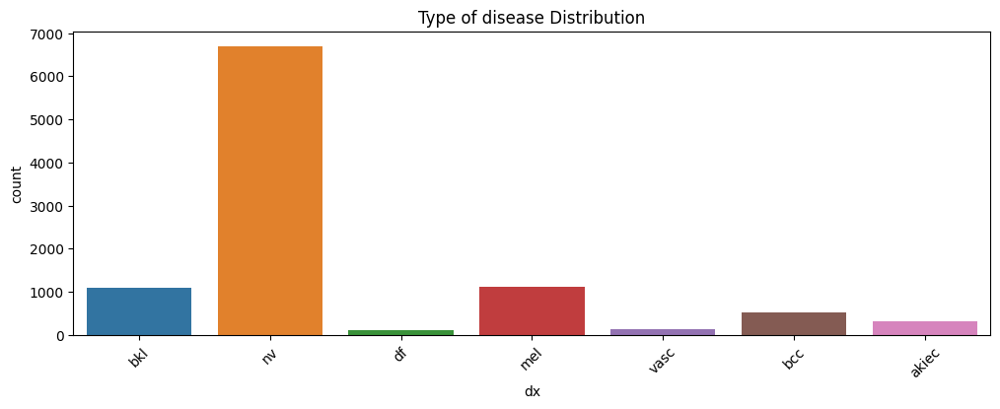

In [19]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='dx')
plt.title('Type of disease Distribution')
plt.xticks(rotation=45)
plt.show()

The skin condition that is more prevalent in the dataset is the melanocytic nevi

In [20]:
for column in categorical_columns:
    meta_data['dx_type'].value_counts()
    
meta_data['dx_type'].value_counts()

dx_type
histo        5340
follow_up    3704
consensus     902
confocal       69
Name: count, dtype: int64

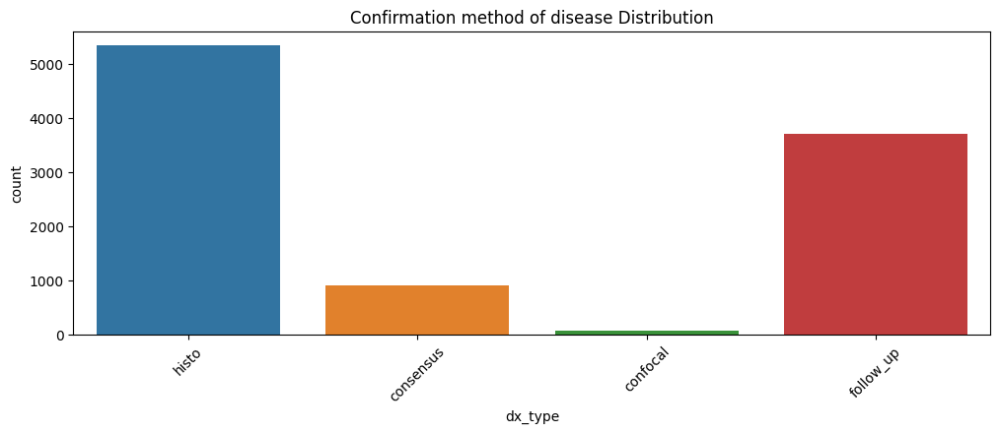

In [21]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='dx_type')
plt.title('Confirmation method of disease Distribution')
plt.xticks(rotation=45)
plt.show()

Most conditions are confirmed through histopathology (histo), secondandly through follow-up examination (follow_up), thirdly through expert consensus (consensus), and lastly through in-vivo confocal microscopy (confocal)

In [22]:
for column in numerical_columns:
    print(f"\nValue counts for {column}:")
    print(meta_data[column].value_counts(dropna=False))  # Include NaN in counts


Value counts for age:
age
45.0    1299
50.0    1187
55.0    1009
40.0     985
60.0     803
70.0     756
35.0     753
65.0     731
75.0     618
30.0     464
80.0     404
85.0     290
25.0     247
20.0     169
5.0       86
15.0      77
NaN       57
10.0      41
0.0       39
Name: count, dtype: int64


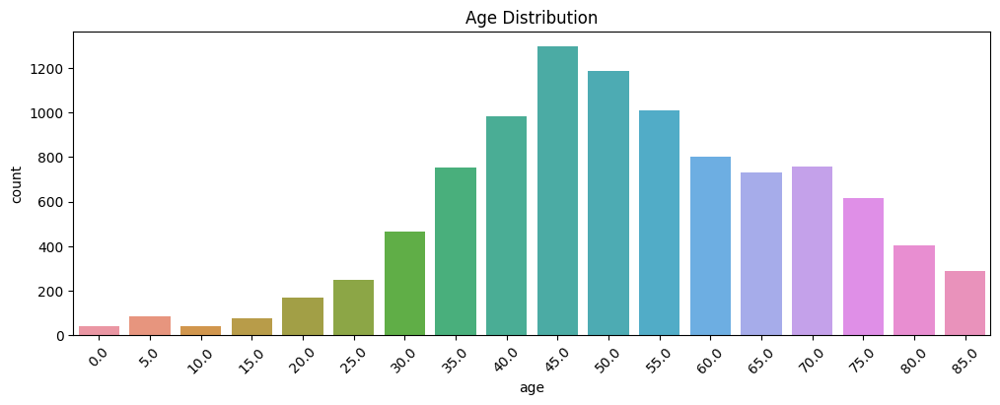

In [23]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='age')
plt.title('Age Distribution')
plt.xticks(rotation=45)
plt.show()

The most prominent age in the dataset, is 45

# Explaratpry Data Analysis for Relationship among variables

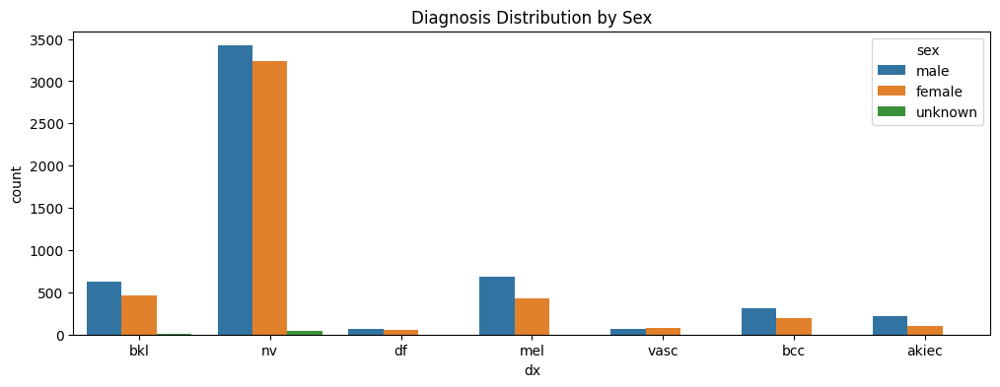

In [24]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='dx', hue='sex')
plt.title('Diagnosis Distribution by Sex')
plt.show()

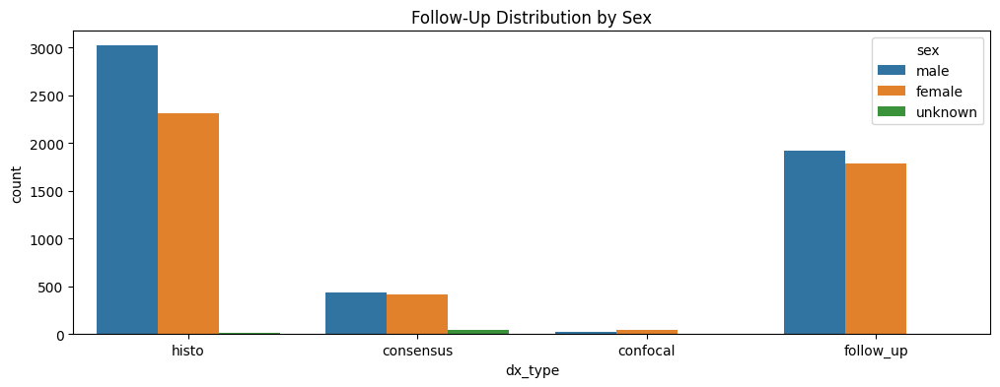

In [25]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='dx_type', hue='sex')
plt.title('Follow-Up Distribution by Sex')
plt.show()

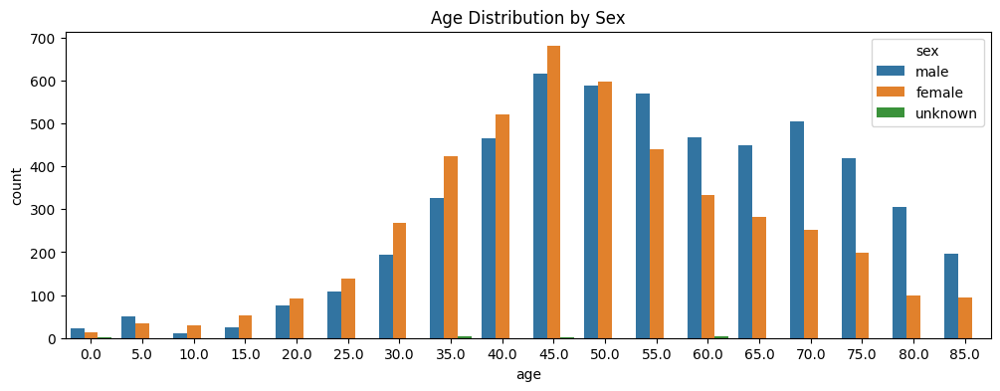

In [26]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='age', hue='sex')
plt.title('Age Distribution by Sex')
plt.show()

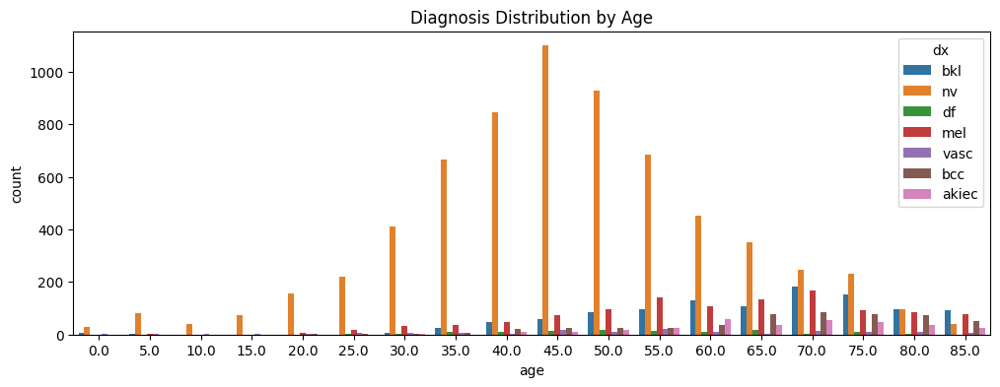

In [27]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='age', hue='dx')
plt.title('Diagnosis Distribution by Age')
plt.show()

nv is the most dominant disease amongst all the ages

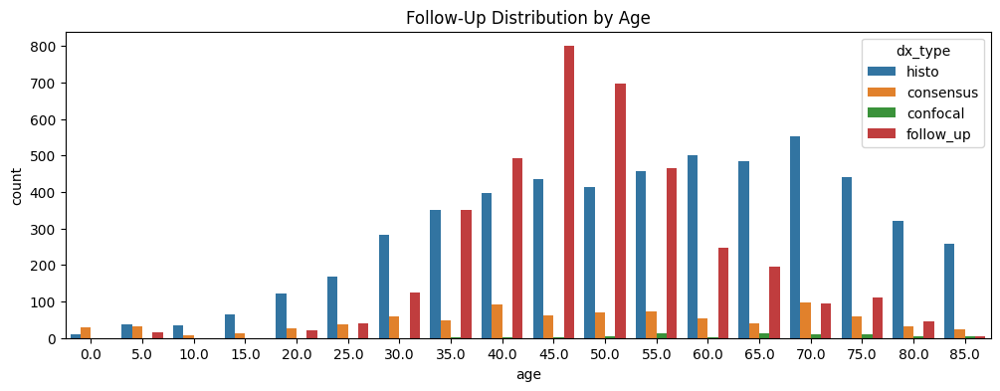

In [28]:
plt.figure(figsize=(12, 4))
sns.countplot(data=meta_data, x='age', hue='dx_type')
plt.title('Follow-Up Distribution by Age')
plt.show()

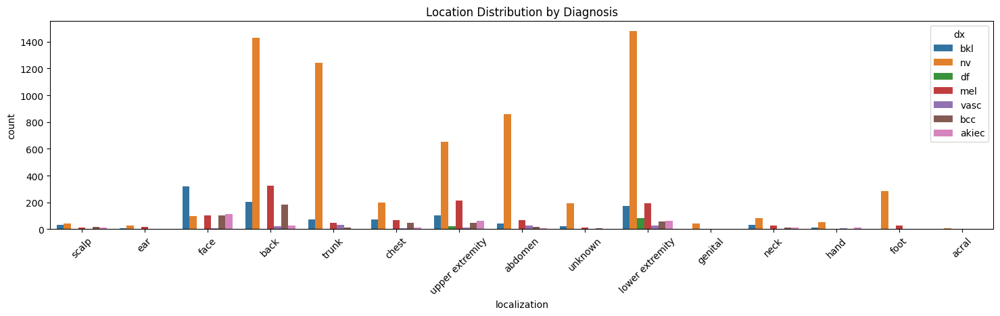

In [29]:
plt.figure(figsize=(18, 4))
sns.countplot(data=meta_data, x='localization', hue='dx')
plt.title('Location Distribution by Diagnosis')
plt.xticks(rotation=45)
plt.show()

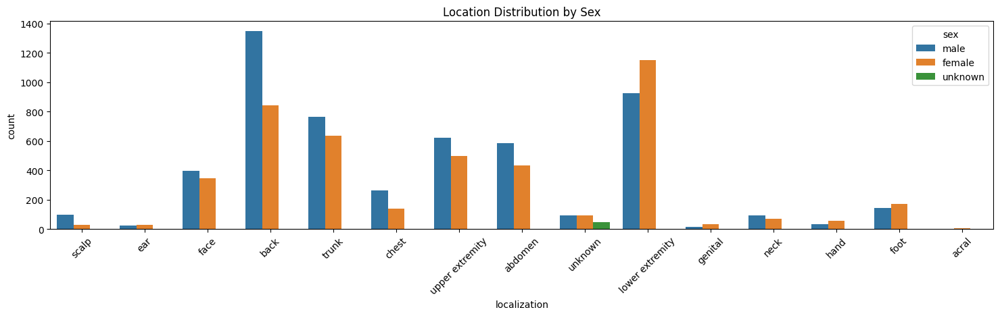

In [30]:
plt.figure(figsize=(18, 4))
sns.countplot(data=meta_data, x='localization', hue='sex')
plt.title('Location Distribution by Sex')
plt.xticks(rotation=45)
plt.show()

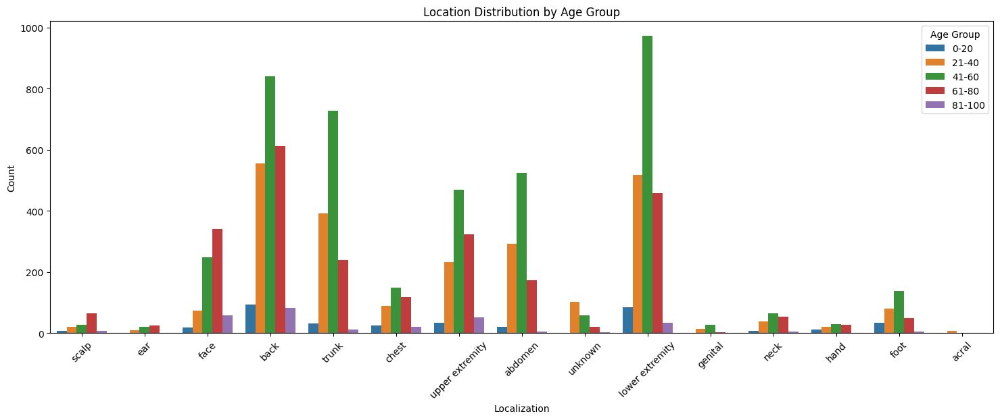

In [31]:
age_groups = pd.cut(meta_data['age'], bins=[0, 20, 40, 60, 80, 100], labels=['0-20', '21-40', '41-60', '61-80', '81-100'])

meta_data['age_group'] = age_groups
plt.figure(figsize=(18, 6))
sns.countplot(data=meta_data, x='localization', hue='age_group')
plt.title('Location Distribution by Age Group')
plt.xlabel('Localization')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Age Group')
plt.show()

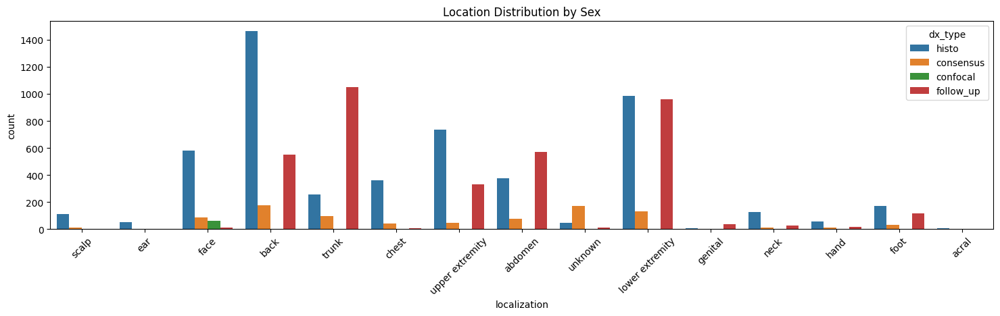

In [32]:
plt.figure(figsize=(18, 4))
sns.countplot(data=meta_data, x='localization', hue='dx_type')
plt.title('Location Distribution by Sex')
plt.xticks(rotation=45)
plt.show()

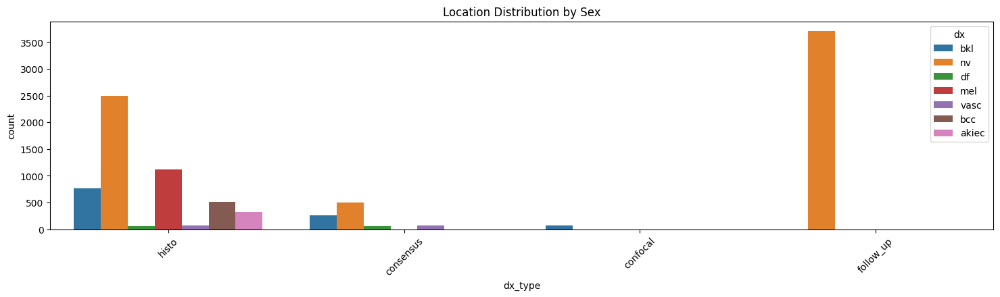

In [33]:
plt.figure(figsize=(18, 4))
sns.countplot(data=meta_data, x='dx_type', hue='dx')
plt.title('Location Distribution by Sex')
plt.xticks(rotation=45)
plt.show()

# DATA PREPROCESSING

Step 1: Data cleansing involves identifying and correcting errors or inconsistencies in the data.

In [34]:
meta_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   lesion_id     10015 non-null  object  
 1   image_id      10015 non-null  object  
 2   dx            10015 non-null  object  
 3   dx_type       10015 non-null  object  
 4   age           9958 non-null   float64 
 5   sex           10015 non-null  object  
 6   localization  10015 non-null  object  
 7   age_group     9919 non-null   category
dtypes: category(1), float64(1), object(6)
memory usage: 557.8+ KB


In [35]:
meta_data.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,age_group
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,61-80
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,61-80
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,61-80
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,61-80
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,61-80


In [36]:
meta_data = meta_data.drop_duplicates()
meta_data = meta_data.drop(columns=['age_group'])

In [37]:
from sklearn.impute import KNNImputer

columns_for_imputation = ['age']
impute_data = meta_data[columns_for_imputation]

imputer = KNNImputer(n_neighbors=5)

imputed_data = imputer.fit_transform(impute_data)

meta_data['age'] = imputed_data[:, 0]

meta_data.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [38]:
meta_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           10015 non-null  float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB


In [39]:
meta_data['age']

0        80.0
1        80.0
2        80.0
3        80.0
4        75.0
         ... 
10010    40.0
10011    40.0
10012    40.0
10013    80.0
10014    70.0
Name: age, Length: 10015, dtype: float64

Fixing column names

In [40]:
meta_data = meta_data.rename(columns={
    'lesion_id': 'Lesion_Id',
    'image_id': 'Image_Id',
    'dx': 'Diagnosis',
    'dx_type': 'Confirmation_Method',
    'age': 'Age',
    'sex': 'Sex',
    'localization': 'Region_Of_Disease'
})

In [41]:
meta_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Lesion_Id            10015 non-null  object 
 1   Image_Id             10015 non-null  object 
 2   Diagnosis            10015 non-null  object 
 3   Confirmation_Method  10015 non-null  object 
 4   Age                  10015 non-null  float64
 5   Sex                  10015 non-null  object 
 6   Region_Of_Disease    10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB


In [42]:
diagnosis_mapping = {
    'mel': 'Melanoma',
    'bkl': 'Benign Keratosis-Like Lesions',
    'bcc': 'Basal Cell Carcinoma',
    'akiec': 'Actinic Keratoses',
    'vasc': 'Vascular Lesions',
    'df': 'Dermatofibroma',
    'nv': 'Melanocytic Nevi'
}

meta_data['Updated_Diagnosis'] = meta_data['Diagnosis'].map(diagnosis_mapping)

In [43]:
meta_data.head()

,Lesion_Id,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease,Updated_Diagnosis
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,Benign Keratosis-Like Lesions
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,Benign Keratosis-Like Lesions
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,Benign Keratosis-Like Lesions
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,Benign Keratosis-Like Lesions
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,Benign Keratosis-Like Lesions


In [44]:
meta_data['Age'] = meta_data['Age'].astype(int)

In [45]:
meta_data.head()

,Lesion_Id,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease,Updated_Diagnosis
0,HAM_0000118,ISIC_0027419,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions
1,HAM_0000118,ISIC_0025030,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions
2,HAM_0002730,ISIC_0026769,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions
3,HAM_0002730,ISIC_0025661,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions
4,HAM_0001466,ISIC_0031633,bkl,histo,75,male,ear,Benign Keratosis-Like Lesions


In [46]:
meta_data.isna().sum()

Lesion_Id              0
Image_Id               0
Diagnosis              0
Confirmation_Method    0
Age                    0
Sex                    0
Region_Of_Disease      0
Updated_Diagnosis      0
dtype: int64

# PreProcessing Complete

In [47]:
image_path1='/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1'
image_path2='/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2'

In [48]:
final_image_dataset = '/kaggle/working/skin-cancer-mnist-ham10000'

In [49]:
import os
import shutil
if not os.path.exists(final_image_dataset):
    os.makedirs(final_image_dataset)

for filename in os.listdir(image_path1):
    if filename.endswith('.jpg') or filename.endswith('.png'):  
        shutil.copy(os.path.join(image_path1, filename), final_image_dataset)

for filename in os.listdir(image_path2):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        shutil.copy(os.path.join(image_path2, filename), final_image_dataset)

In [50]:
meta_data['Image_path'] = meta_data['Image_Id'].apply(lambda x: os.path.join(final_image_dataset, f"{x}.jpg"))

In [51]:
meta_data

,Lesion_Id,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease,Updated_Diagnosis,Image_path
0,HAM_0000118,ISIC_0027419,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
1,HAM_0000118,ISIC_0025030,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
2,HAM_0002730,ISIC_0026769,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
3,HAM_0002730,ISIC_0025661,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
4,HAM_0001466,ISIC_0031633,bkl,histo,75,male,ear,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
...,...,...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40,male,abdomen,Actinic Keratoses,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
10011,HAM_0002867,ISIC_0033550,akiec,histo,40,male,abdomen,Actinic Keratoses,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
10012,HAM_0002867,ISIC_0033536,akiec,histo,40,male,abdomen,Actinic Keratoses,/kaggle/working/skin-cancer-mnist-ham10000/ISI...
10013,HAM_0000239,ISIC_0032854,akiec,histo,80,male,face,Actinic Keratoses,/kaggle/working/skin-cancer-mnist-ham10000/ISI...


# Label Encoder

In [52]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
meta_data['Updated_Diagnosis_Label'] = label_encoder.fit_transform(meta_data['Updated_Diagnosis'])

label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label Encoding Mapping:")
print(label_mapping)

Label Encoding Mapping:
{'Actinic Keratoses': 0, 'Basal Cell Carcinoma': 1, 'Benign Keratosis-Like Lesions': 2, 'Dermatofibroma': 3, 'Melanocytic Nevi': 4, 'Melanoma': 5, 'Vascular Lesions': 6}


In [53]:
meta_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Lesion_Id                10015 non-null  object
 1   Image_Id                 10015 non-null  object
 2   Diagnosis                10015 non-null  object
 3   Confirmation_Method      10015 non-null  object
 4   Age                      10015 non-null  int64 
 5   Sex                      10015 non-null  object
 6   Region_Of_Disease        10015 non-null  object
 7   Updated_Diagnosis        10015 non-null  object
 8   Image_path               10015 non-null  object
 9   Updated_Diagnosis_Label  10015 non-null  int64 
dtypes: int64(2), object(8)
memory usage: 782.5+ KB


In [54]:
meta_data.head()

,Lesion_Id,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease,Updated_Diagnosis,Image_path,Updated_Diagnosis_Label
0,HAM_0000118,ISIC_0027419,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80,male,scalp,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75,male,ear,Benign Keratosis-Like Lesions,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,2


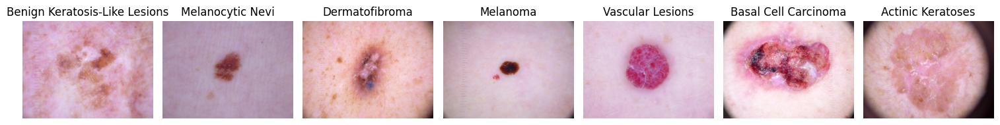

In [55]:
for i in range(len(meta_data)):
    if not os.path.isfile(meta_data['Image_path'].iloc[i]):
        raise FileNotFoundError(f"Image file not found: {meta_data['Image_path'].iloc[i]}")

class_images = meta_data.drop_duplicates(subset='Updated_Diagnosis')

def plot_class_images(class_images):
    plt.figure(figsize=(15, 5))
    num_classes = len(class_images)
    for i in range(num_classes):
        plt.subplot(1, num_classes, i + 1)
        img = plt.imread(class_images['Image_path'].iloc[i])
        plt.imshow(img)
        plt.axis('off')
        plt.title(class_images['Updated_Diagnosis'].iloc[i], fontsize=12)
    plt.tight_layout()
    plt.show()

plot_class_images(class_images)

In [56]:
meta_data['Updated_Diagnosis'].unique()

array(['Benign Keratosis-Like Lesions', 'Melanocytic Nevi',
       'Dermatofibroma', 'Melanoma', 'Vascular Lesions',
       'Basal Cell Carcinoma', 'Actinic Keratoses'], dtype=object)

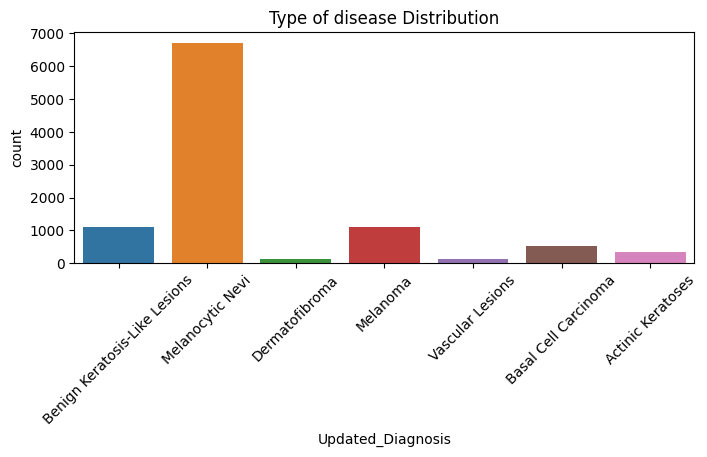

In [57]:
plt.figure(figsize=(8, 3))
sns.countplot(data=meta_data, x='Updated_Diagnosis')
plt.title('Type of disease Distribution')
plt.xticks(rotation=45)
plt.show()

# Augment and Balance classes

In [58]:
pip install imgaug opencv-python

Note: you may need to restart the kernel to use updated packages.


In [59]:
import numpy as np
import pandas as pd
from sklearn.utils import resample
import imgaug.augmenters as iaa
from sklearn.model_selection import train_test_split
from skimage import io

In [60]:
import os
import pandas as pd
from skimage import io
import imgaug.augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

aug_pipeline = iaa.Sequential([
    iaa.Fliplr(0.5),  
    iaa.Flipud(0.5),  
    iaa.Affine(rotate=(-10, 10)),  
    iaa.Affine(scale={"x": (0.9, 1.1), "y": (0.9, 1.1)}),  
    iaa.Crop(percent=(0, 0.2)),  
    iaa.Affine(shear=(-5, 5)),  
    iaa.GaussianBlur(sigma=(0, 0.5)),  
    iaa.AdditiveGaussianNoise(scale=(0, 0.01*255)),  
    iaa.LinearContrast((0.9, 1.1)),  
    iaa.Resize({"height": "keep-aspect-ratio", "width": 256})
])

augmented_images_dir = '/path/to/augmented_images'
os.makedirs(augmented_images_dir, exist_ok=True)

class_counts = meta_data['Diagnosis'].value_counts()
max_count = class_counts.max()
balanced_samples = []

for label in class_counts.index:
    class_subset = meta_data[meta_data['Diagnosis'] == label]

    if len(class_subset) < max_count:
        n_augmentations = max_count - len(class_subset)
        augmented_samples = []
        for i in range(n_augmentations):
            sample = class_subset.sample(n=1, random_state=42).iloc[0]
            img_path = sample['Image_path']
            img = io.imread(img_path)
            augmented_image = aug_pipeline(image=img)

            
            augmented_image_path = os.path.join(augmented_images_dir, f'{label}_augmented_{i}.jpg')
            io.imsave(augmented_image_path, augmented_image)

            
            augmented_sample = sample.copy()
            augmented_sample['Image_path'] = augmented_image_path
            augmented_samples.append(augmented_sample)

        augmented_df = pd.DataFrame(augmented_samples)
        class_oversampled = pd.concat([class_subset, augmented_df], ignore_index=True)
    else:
        class_oversampled = class_subset

    balanced_samples.append(class_oversampled)

balanced_dataset = pd.concat(balanced_samples).reset_index(drop=True)

print("Dataset balanced successfully!")

Dataset balanced successfully!


In [61]:
meta_data = balanced_dataset
meta_data.head()

,Lesion_Id,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease,Updated_Diagnosis,Image_path,Updated_Diagnosis_Label
0,HAM_0001751,ISIC_0024698,nv,consensus,70,male,face,Melanocytic Nevi,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,4
1,HAM_0000559,ISIC_0024693,nv,follow_up,45,female,upper extremity,Melanocytic Nevi,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,4
2,HAM_0004932,ISIC_0032212,nv,follow_up,45,female,foot,Melanocytic Nevi,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,4
3,HAM_0004516,ISIC_0025775,nv,follow_up,45,female,neck,Melanocytic Nevi,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,4
4,HAM_0006510,ISIC_0029828,nv,follow_up,55,female,lower extremity,Melanocytic Nevi,/kaggle/working/skin-cancer-mnist-ham10000/ISI...,4


In [62]:
meta_data['Updated_Diagnosis'].unique()

array(['Melanocytic Nevi', 'Melanoma', 'Benign Keratosis-Like Lesions',
       'Basal Cell Carcinoma', 'Actinic Keratoses', 'Vascular Lesions',
       'Dermatofibroma'], dtype=object)

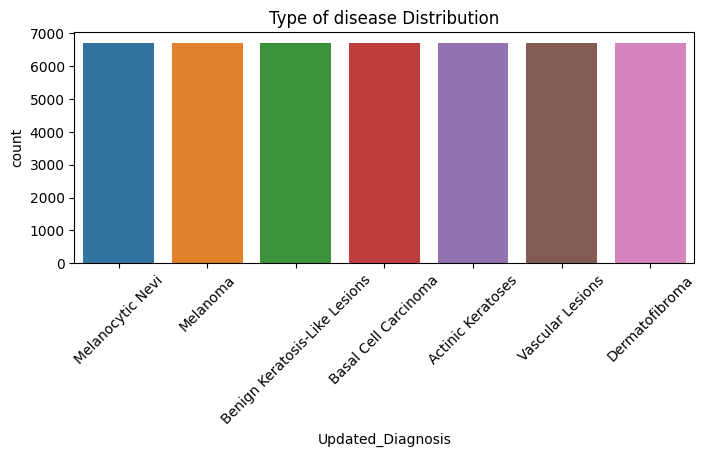

In [63]:
plt.figure(figsize=(8, 3))
sns.countplot(data=meta_data, x='Updated_Diagnosis')
plt.title('Type of disease Distribution')
plt.xticks(rotation=45)
plt.show()

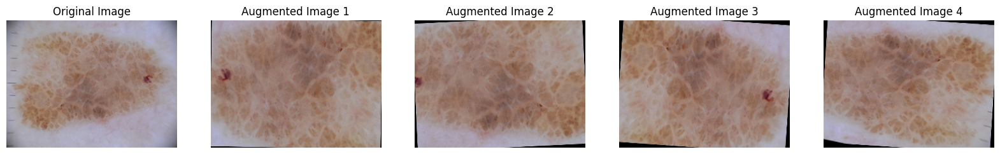

In [65]:
import imgaug.augmenters as iaa
import imageio
image = imageio.imread('/kaggle/working/skin-cancer-mnist-ham10000/ISIC_0024471.jpg')

mean_pixel_value = int(np.mean(image))

aug_pipeline = iaa.Sequential([
    iaa.Fliplr(0.5),  
    iaa.Flipud(0.5),  
    iaa.Affine(rotate=(-10, 10)),  
    iaa.Affine(scale={"x": (0.9, 1.1), "y": (0.9, 1.1)}),  
    iaa.Crop(percent=(0, 0.2)),  
    iaa.Affine(shear=(-5, 5)),  
    iaa.GaussianBlur(sigma=(0, 0.5)),  
    iaa.AdditiveGaussianNoise(scale=(0, 0.01*255)),  
    iaa.LinearContrast((0.9, 1.1)),  
    iaa.Resize({"height": "keep-aspect-ratio", "width": 256})
])

augmented_images = [aug_pipeline(image=image) for _ in range(4)]

fig, axes = plt.subplots(1, 5, figsize=(20, 10))
axes[0].imshow(image)
axes[0].set_title('Original Image')
axes[0].axis('off')

for i, aug_img in enumerate(augmented_images):
    axes[i+1].imshow(aug_img)
    axes[i+1].set_title(f'Augmented Image {i+1}')
    axes[i+1].axis('off')

plt.show()

# Split

In [66]:
X = meta_data.drop(columns=['Updated_Diagnosis_Label']) 
y = meta_data['Updated_Diagnosis_Label']

print("Shape of features (X):", X.shape)
print("Shape of target variable (y):", y.shape)

Shape of features (X): (46935, 9)
Shape of target variable (y): (46935,)


In [67]:
from sklearn.model_selection import train_test_split

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [68]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    brightness_range=[0.8, 1.2],
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=X_train,
    x_col='Image_path',
    y_col='Updated_Diagnosis',
    target_size=(224, 224),
    batch_size=100,
    class_mode='categorical'
)

val_generator = test_datagen.flow_from_dataframe(
    dataframe=X_val,
    x_col='Image_path',
    y_col='Updated_Diagnosis',
    target_size=(224, 224),
    batch_size=100,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=X_test,
    x_col='Image_path',
    y_col='Updated_Diagnosis',
    target_size=(224, 224),
    batch_size=100,
    class_mode='categorical',
    shuffle=False
)

Found 37548 validated image filenames belonging to 7 classes.
Found 4693 validated image filenames belonging to 7 classes.
Found 4694 validated image filenames belonging to 7 classes.


# DenseNet201

In [72]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

base_model =DenseNet201(weights='imagenet',include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
predictions = Dense(7, activation='softmax')(x)

74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [73]:
# Final model
model = Model(inputs=base_model.input, outputs=predictions)

In [74]:
for layer in base_model.layers:
    layer.trainable = False

In [75]:
from tensorflow.keras.optimizers import Adamax

model.compile(loss='categorical_crossentropy',
              optimizer=Adamax(),
            metrics=['accuracy'])

In [76]:
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
checkpoint = ModelCheckpoint(filepath='model_weights.keras', monitor='val_loss', save_best_only=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, min_lr=0.00001)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [77]:
class_counts = meta_data['Updated_Diagnosis_Label'].value_counts().to_dict()
total_samples = sum(class_counts.values())
class_weights = {i: total_samples/count for i, count in enumerate(class_counts.values())}

print("Class weights:", class_weights)

Class weights: {0: 7.0, 1: 7.0, 2: 7.0, 3: 7.0, 4: 7.0, 5: 7.0, 6: 7.0}


In [78]:
class_weights_dict = dict(enumerate(class_weights))

In [79]:
history=model.fit(
    train_generator,
    epochs=10,
    batch_size=32,
    validation_data=val_generator,
    callbacks=[reduce_lr, early_stopping]
)

Epoch 1/10


I0000 00:00:1725846029.492347     100 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1725846029.612036     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


204/376 ━━━━━━━━━━━━━━━━━━━━ 4:15 1s/step - accuracy: 0.7909 - loss: 2.0509

W0000 00:00:1725846331.562957     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


376/376 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8362 - loss: 1.7078

W0000 00:00:1725846560.264503     101 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1725846632.772855      99 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


376/376 ━━━━━━━━━━━━━━━━━━━━ 698s 2s/step - accuracy: 0.8364 - loss: 1.7064 - val_accuracy: 0.9290 - val_loss: 0.8104 - learning_rate: 0.0010
Epoch 2/10
376/376 ━━━━━━━━━━━━━━━━━━━━ 495s 1s/step - accuracy: 0.9315 - loss: 0.7324 - val_accuracy: 0.9369 - val_loss: 0.5551 - learning_rate: 0.0010
Epoch 3/10
376/376 ━━━━━━━━━━━━━━━━━━━━ 501s 1s/step - accuracy: 0.9353 - loss: 0.5212 - val_accuracy: 0.9295 - val_loss: 0.4462 - learning_rate: 0.0010
Epoch 4/10
376/376 ━━━━━━━━━━━━━━━━━━━━ 503s 1s/step - accuracy: 0.9395 - loss: 0.4051 - val_accuracy: 0.9393 - val_loss: 0.3556 - learning_rate: 0.0010
Epoch 5/10
376/376 ━━━━━━━━━━━━━━━━━━━━ 499s 1s/step - accuracy: 0.9410 - loss: 0.3322 - val_accuracy: 0.9425 - val_loss: 0.2893 - learning_rate: 0.0010
Epoch 6/10
376/376 ━━━━━━━━━━━━━━━━━━━━ 500s 1s/step - accuracy: 0.9419 - loss: 0.2913 - val_accuracy: 0.9399 - val_loss: 0.2561 - learning_rate: 0.0010
Epoch 7/10
376/376 ━━━━━━━━━━━━━━━━━━━━ 502s 1s/step - accuracy: 0.9420 - loss: 0.2616 - val_

In [ ]:
loss, accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {accuracy:.2f}")

46/47 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step - accuracy: 0.9472 - loss: 0.2150

W0000 00:00:1725851192.339252     101 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


47/47 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step - accuracy: 0.9471 - loss: 0.2152 
Test Accuracy: 0.94


In [ ]:
loss, accuracy = model.evaluate(train_generator)
print(f"Train Accuracy: {accuracy:.2f}")

376/376 ━━━━━━━━━━━━━━━━━━━━ 491s 1s/step - accuracy: 0.9488 - loss: 0.1942
Train Accuracy: 0.95


W0000 00:00:1725851684.845053      99 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [ ]:
loss, accuracy = model.evaluate(val_generator)
print(f"Validation Accuracy: {accuracy:.2f}")

47/47 ━━━━━━━━━━━━━━━━━━━━ 15s 322ms/step - accuracy: 0.9473 - loss: 0.2133
Validation Accuracy: 0.95


# Testing With External Dataset

## Saving the Model

In [89]:
model.save('Bonolo_Skin_disease_DenseNetmodel.h5')

## Load the Model

In [ ]:
from tensorflow.keras.models import load_model

model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')

In [ ]:
sample_meta=pd.read_csv('/kaggle/input/skin-disease-samples1/Samples/Sample_meta-data.csv')
sample_meta

,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease
0,ISIC_10027419,mel,confocal,60,male,back
1,ISIC_20025030,akiec,consensus,50,male,scalp
2,ISIC_30026769,bcc,histo,80,male,trunk
3,ISIC_40025661,df,follow_up,20,male,scalp
4,ISIC_50031633,nv,histo,75,male,abdomen
5,ISIC_60027850,vasc,consensus,75,male,ear
6,ISIC_70029176,bkl,histo,55,male,face


In [ ]:
sample_final_dataset='/kaggle/input/skin-disease-samples1/Samples/Sample Images'

In [ ]:
sample_meta['Image_path'] = sample_meta['Image_Id'].apply(lambda x: os.path.join(sample_final_dataset, f"{x}.jpg"))
sample_meta

,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease,Image_path
0,ISIC_10027419,mel,confocal,60,male,back,/kaggle/input/skin-disease-samples1/Samples/Sa...
1,ISIC_20025030,akiec,consensus,50,male,scalp,/kaggle/input/skin-disease-samples1/Samples/Sa...
2,ISIC_30026769,bcc,histo,80,male,trunk,/kaggle/input/skin-disease-samples1/Samples/Sa...
3,ISIC_40025661,df,follow_up,20,male,scalp,/kaggle/input/skin-disease-samples1/Samples/Sa...
4,ISIC_50031633,nv,histo,75,male,abdomen,/kaggle/input/skin-disease-samples1/Samples/Sa...
5,ISIC_60027850,vasc,consensus,75,male,ear,/kaggle/input/skin-disease-samples1/Samples/Sa...
6,ISIC_70029176,bkl,histo,55,male,face,/kaggle/input/skin-disease-samples1/Samples/Sa...


In [90]:
sample_meta.columns

Index(['Image_Id', 'Diagnosis', 'Confirmation_Method', 'Age', 'Sex',
       'Region_Of_Disease', 'Image_path'],
      dtype='object')

In [96]:
sample_meta['Image_path']

0    /kaggle/input/skin-disease-samples1/Samples/Sa...
1    /kaggle/input/skin-disease-samples1/Samples/Sa...
2    /kaggle/input/skin-disease-samples1/Samples/Sa...
3    /kaggle/input/skin-disease-samples1/Samples/Sa...
4    /kaggle/input/skin-disease-samples1/Samples/Sa...
5    /kaggle/input/skin-disease-samples1/Samples/Sa...
6    /kaggle/input/skin-disease-samples1/Samples/Sa...
Name: Image_path, dtype: object

## External Images

In [92]:
csv_file = '/kaggle/input/skin-disease-samples1/Samples/Sample_meta-data.csv'
df = pd.read_csv(csv_file)
print(df.columns)

Index(['Image_Id', 'Diagnosis', 'Confirmation_Method', 'Age', 'Sex',
       'Region_Of_Disease'],
      dtype='object')


In [93]:
df['Image_path'] = df['Image_Id'].apply(lambda x: os.path.join(sample_final_dataset, f"{x}.jpg"))
df

,Image_Id,Diagnosis,Confirmation_Method,Age,Sex,Region_Of_Disease,Image_path
0,ISIC_10027419,mel,confocal,60,male,back,/kaggle/input/skin-disease-samples1/Samples/Sa...
1,ISIC_20025030,akiec,consensus,50,male,scalp,/kaggle/input/skin-disease-samples1/Samples/Sa...
2,ISIC_30026769,bcc,histo,80,male,trunk,/kaggle/input/skin-disease-samples1/Samples/Sa...
3,ISIC_40025661,df,follow_up,20,male,scalp,/kaggle/input/skin-disease-samples1/Samples/Sa...
4,ISIC_50031633,nv,histo,75,male,abdomen,/kaggle/input/skin-disease-samples1/Samples/Sa...
5,ISIC_60027850,vasc,consensus,75,male,ear,/kaggle/input/skin-disease-samples1/Samples/Sa...
6,ISIC_70029176,bkl,histo,55,male,face,/kaggle/input/skin-disease-samples1/Samples/Sa...


In [101]:
image_directory = '/kaggle/input/skin-disease-samples1/Samples/Sample Images'

files = os.listdir(image_directory)
print(files) 

['ISIC_50031633.jpg', 'ISIC_10027419.jpg', 'ISIC_30026769.jpg', 'ISIC_40025661.jpeg', 'ISIC_20025030.jpg', 'ISIC_70029176.jpg', 'ISIC_60027850.jpg']


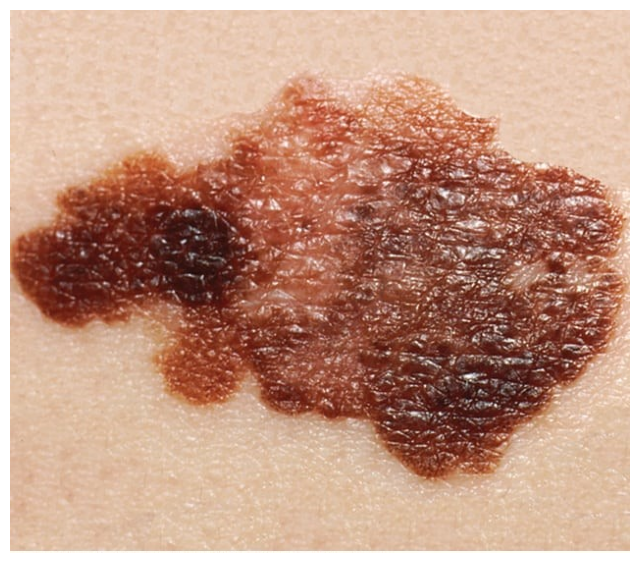

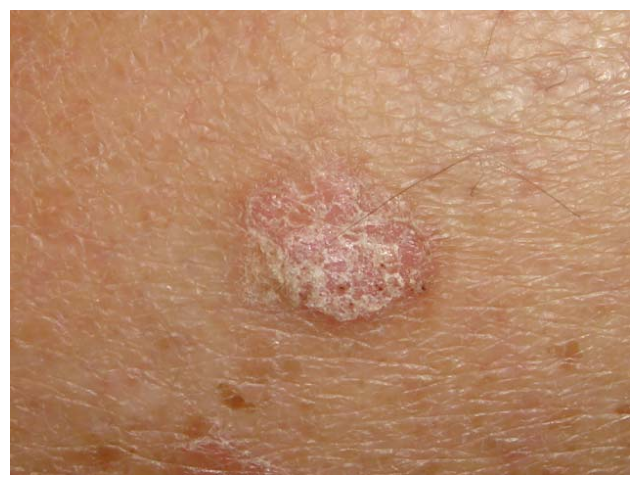

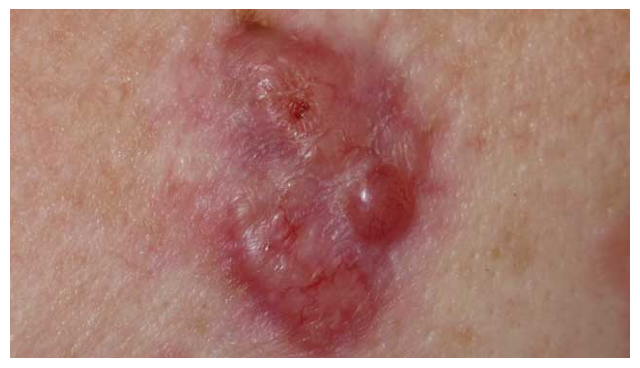

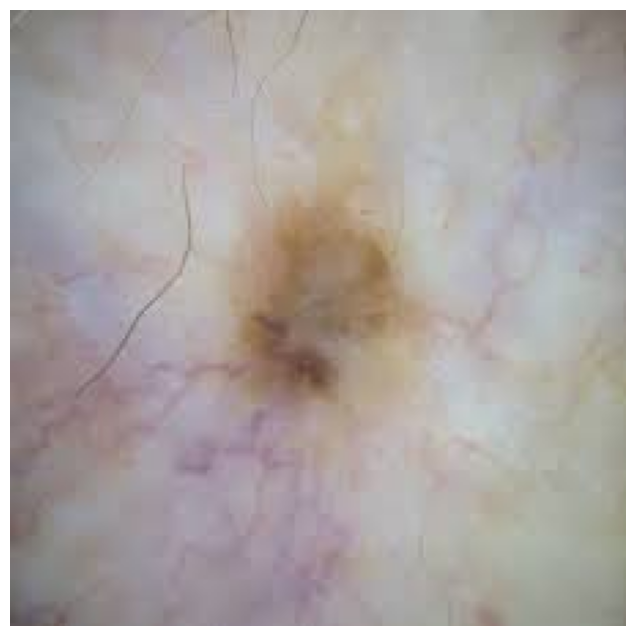

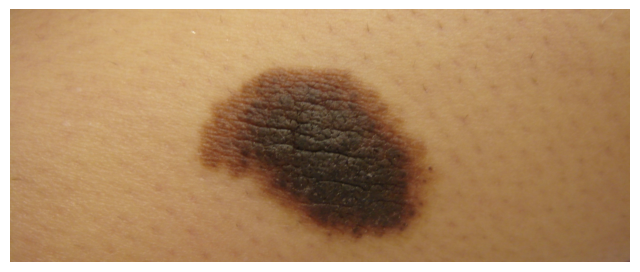

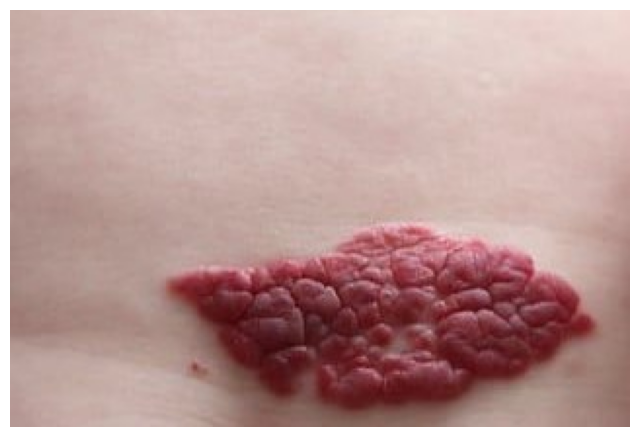

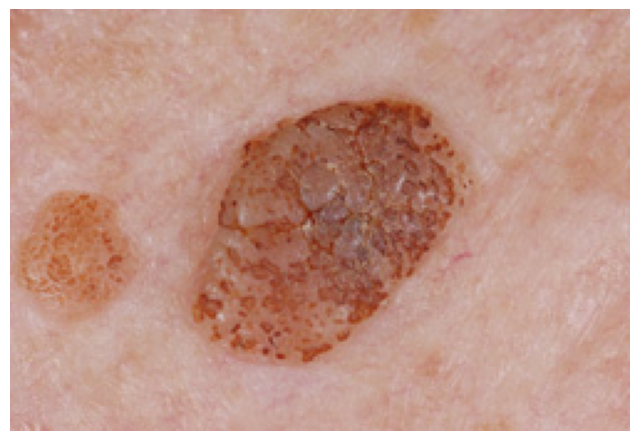

In [105]:
import os
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

def display_images_from_csv(csv_file):
    df = sample_meta
    
    image_directory = '/kaggle/input/skin-disease-samples1/Samples/Sample Images'

    for index, row in df.iterrows():
        image_filename = row['Image_path']
        
        possible_extensions = ['.jpg', '.jpeg', '.png']
        image_path = None
        for ext in possible_extensions:
            potential_path = os.path.join(image_directory, os.path.splitext(image_filename)[0] + ext)
            if os.path.exists(potential_path):
                image_path = potential_path
                break
        
        if image_path:
            image = mpimg.imread(image_path)
            plt.figure(figsize=(8, 8))
            plt.imshow(image)
            plt.axis('off')
            plt.show()
        else:
            print(f"Image not found: {image_filename}")

display_images_from_csv(df)

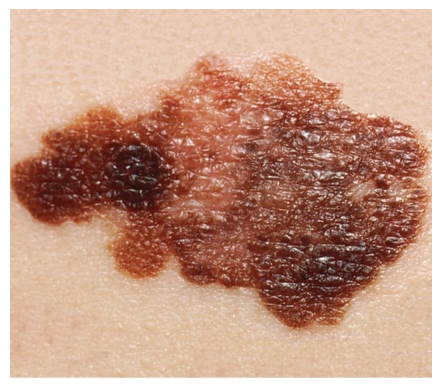

In [119]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#Melanoma
image_path = ('/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_10027419.jpg')
image = mpimg.imread(image_path)
plt.imshow(image)
plt.axis('off') 
plt.show()

In [120]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.densenet import preprocess_input

def preprocess_image(image_path, target_size=(224, 224)):
    
    image = load_img(image_path, target_size=target_size)
  
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    return image_array

def predict_skin_disease(model, image_path, class_labels):
    image_array = preprocess_image(image_path)
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]
    return predicted_class_label

class_labels = ['Actinic Keratoses', 'Basal Cell Carcinoma', 
                'Benign Keratosis-Like Lesions', 'Dermatofibroma', 
                'Melanocytic Nevi', 'Melanoma', 'Vascular Lesions']

image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_10027419.jpg'

model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')

predicted_class_label = predict_skin_disease(model, image_path, class_labels)
print(f"Predicted Skin Disease Type: {predicted_class_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
Predicted Skin Disease Type: Melanoma


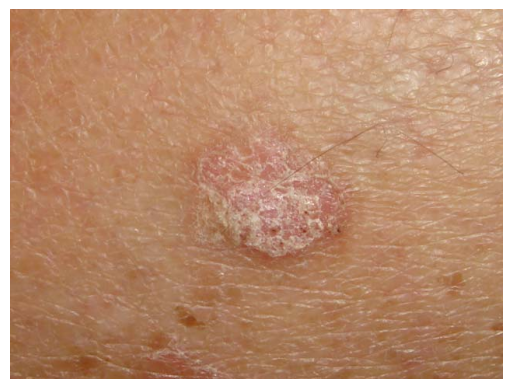

In [121]:
#Actinic Keratoses
image_path1 = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_20025030.jpg'
image1 = mpimg.imread(image_path1)

plt.imshow(image1)
plt.axis('off')
plt.show()

In [122]:
def preprocess_image(image_path1, target_size=(224, 224)):
    image1 = load_img(image_path1, target_size=target_size)
    image_array = img_to_array(image1)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    return image_array

def predict_skin_disease(model, image_path1, class_labels):
    image_array = preprocess_image(image_path1)
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]
    return predicted_class_label

class_labels = ['Actinic Keratoses', 'Basal Cell Carcinoma', 
                'Benign Keratosis-Like Lesions', 'Dermatofibroma', 
                'Melanocytic Nevi', 'Melanoma', 'Vascular Lesions']

image_path1 = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_20025030.jpg'


model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')

predicted_class_label = predict_skin_disease(model, image_path1, class_labels)
print(f"Predicted Skin Disease Type: {predicted_class_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
Predicted Skin Disease Type: Benign Keratosis-Like Lesions


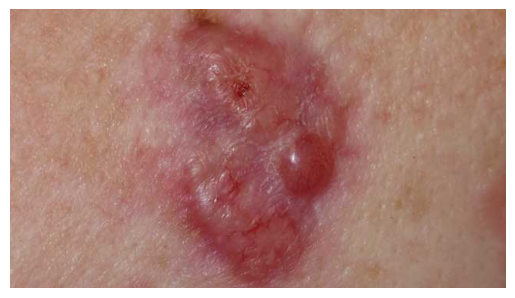

In [123]:
#Basal Cell Carcinoma
image_path3 = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_30026769.jpg'
image3 = mpimg.imread(image_path3)
plt.imshow(image3)
plt.axis('off')  
plt.show()

In [124]:
def preprocess_image(image_path3, target_size=(224, 224)):
    image3 = load_img(image_path3, target_size=target_size)
    image_array = img_to_array(image3)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    return image_array

def predict_skin_disease(model, image_path3, class_labels):
    image_array = preprocess_image(image_path3)
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]
    return predicted_class_label

class_labels = ['Actinic Keratoses', 'Basal Cell Carcinoma', 
                'Benign Keratosis-Like Lesions', 'Dermatofibroma', 
                'Melanocytic Nevi', 'Melanoma', 'Vascular Lesions']

image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_30026769.jpg'

model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')
predicted_class_label = predict_skin_disease(model, image_path3, class_labels)
print(f"Predicted Skin Disease Type: {predicted_class_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
Predicted Skin Disease Type: Basal Cell Carcinoma


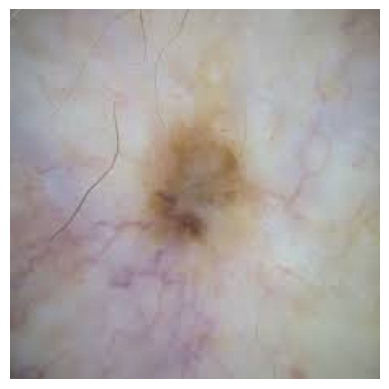

In [125]:
#Dermatofibroma
image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_40025661.jpeg'
image = mpimg.imread(image_path)
plt.imshow(image)
plt.axis('off') 
plt.show()

In [126]:
def preprocess_image(image_path, target_size=(224, 224)):
    
    image = load_img(image_path, target_size=target_size)
  
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    return image_array

def predict_skin_disease(model, image_path, class_labels):
    image_array = preprocess_image(image_path)
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]
    return predicted_class_label

class_labels = ['Actinic Keratoses', 'Basal Cell Carcinoma', 
                'Benign Keratosis-Like Lesions', 'Dermatofibroma', 
                'Melanocytic Nevi', 'Melanoma', 'Vascular Lesions']

image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_40025661.jpeg'

model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')

predicted_class_label = predict_skin_disease(model, image_path, class_labels)
print(f"Predicted Skin Disease Type: {predicted_class_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
Predicted Skin Disease Type: Melanoma


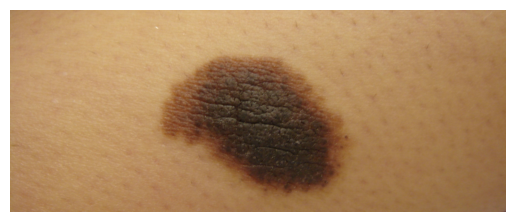

In [127]:
#Melanocytic Nevi
image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_50031633.jpg'
image = mpimg.imread(image_path)
plt.imshow(image)
plt.axis('off') 
plt.show()

In [128]:
def preprocess_image(image_path, target_size=(224, 224)):
    
    image = load_img(image_path, target_size=target_size)
  
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    return image_array

def predict_skin_disease(model, image_path, class_labels):
    image_array = preprocess_image(image_path)
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]
    return predicted_class_label

class_labels = ['Actinic Keratoses', 'Basal Cell Carcinoma', 
                'Benign Keratosis-Like Lesions', 'Dermatofibroma', 
                'Melanocytic Nevi', 'Melanoma', 'Vascular Lesions']

image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_50031633.jpg'

model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')

predicted_class_label = predict_skin_disease(model, image_path, class_labels)
print(f"Predicted Skin Disease Type: {predicted_class_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
Predicted Skin Disease Type: Melanocytic Nevi


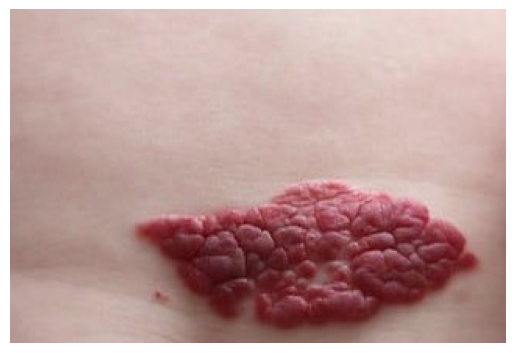

In [129]:
#Vascular Lesions
image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_60027850.jpg'
image = mpimg.imread(image_path)
plt.imshow(image)
plt.axis('off') 
plt.show()

In [130]:
def preprocess_image(image_path, target_size=(224, 224)):
    
    image = load_img(image_path, target_size=target_size)
  
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    return image_array

def predict_skin_disease(model, image_path, class_labels):
    image_array = preprocess_image(image_path)
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]
    return predicted_class_label

class_labels = ['Actinic Keratoses', 'Basal Cell Carcinoma', 
                'Benign Keratosis-Like Lesions', 'Dermatofibroma', 
                'Melanocytic Nevi', 'Melanoma', 'Vascular Lesions']

image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_60027850.jpg'

model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')

predicted_class_label = predict_skin_disease(model, image_path, class_labels)
print(f"Predicted Skin Disease Type: {predicted_class_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
Predicted Skin Disease Type: Vascular Lesions


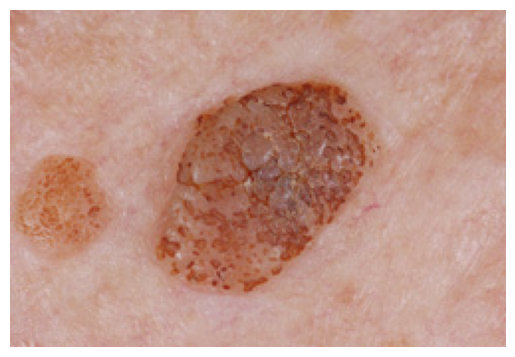

In [131]:
#Bkll
image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_70029176.jpg'
image = mpimg.imread(image_path)
plt.imshow(image)
plt.axis('off') 
plt.show()

In [132]:
def preprocess_image(image_path, target_size=(224, 224)):
    
    image = load_img(image_path, target_size=target_size)
  
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    return image_array

def predict_skin_disease(model, image_path, class_labels):
    image_array = preprocess_image(image_path)
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    predicted_class_label = class_labels[predicted_class_index]
    return predicted_class_label

class_labels = ['Actinic Keratoses', 'Basal Cell Carcinoma', 
                'Benign Keratosis-Like Lesions', 'Dermatofibroma', 
                'Melanocytic Nevi', 'Melanoma', 'Vascular Lesions']

image_path = '/kaggle/input/skin-disease-samples1/Samples/Sample Images/ISIC_70029176.jpg'

model = load_model('Bonolo_Skin_disease_DenseNetmodel.h5')

predicted_class_label = predict_skin_disease(model, image_path, class_labels)
print(f"Predicted Skin Disease Type: {predicted_class_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
Predicted Skin Disease Type: Benign Keratosis-Like Lesions


In [136]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score
from sklearn.metrics import mean_squared_error

predictions = model.predict(test_generator, steps=len(test_generator), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes
accuracy = accuracy_score(true_classes, predicted_classes)
cm = confusion_matrix(true_classes, predicted_classes)
sensitivity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
specificity = cm[0, 0] / (cm[0, 1] + cm[0, 0])
report = classification_report(true_classes, predicted_classes, target_names=list(train_generator.class_indices.keys()), output_dict=True)
precision = report['macro avg']['precision']
f1_score = report['macro avg']['f1-score']
auc = roc_auc_score(tf.keras.utils.to_categorical(true_classes), predictions, multi_class='ovr')
mse = mean_squared_error(true_classes, predicted_classes)
bias = (np.mean(predicted_classes) - np.mean(true_classes)) ** 2
variance = np.var(predicted_classes)


print(f"Accuracy: {accuracy:.2f}")
print(f"Sensitivity: {sensitivity:.2f}")
print(f"Specificity: {specificity:.2f}")
print(f"Precision: {precision:.2f}")
print(f"F1-Score: {f1_score:.2f}")
print(f"AUC: {auc:.2f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"Variance: {variance:.2f}")
print(f"Bias: {bias:.2f}")

 1/47 ━━━━━━━━━━━━━━━━━━━━ 12:49 17s/step

W0000 00:00:1725855093.488926     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


47/47 ━━━━━━━━━━━━━━━━━━━━ 45s 618ms/step


W0000 00:00:1725855121.937326     100 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Accuracy: 0.94
Sensitivity: 1.00
Specificity: 0.98
Precision: 0.95
F1-Score: 0.94
AUC: 1.00
Mean Squared Error: 0.26
Variance: 3.95
Bias: 0.00


47/47 ━━━━━━━━━━━━━━━━━━━━ 14s 300ms/step


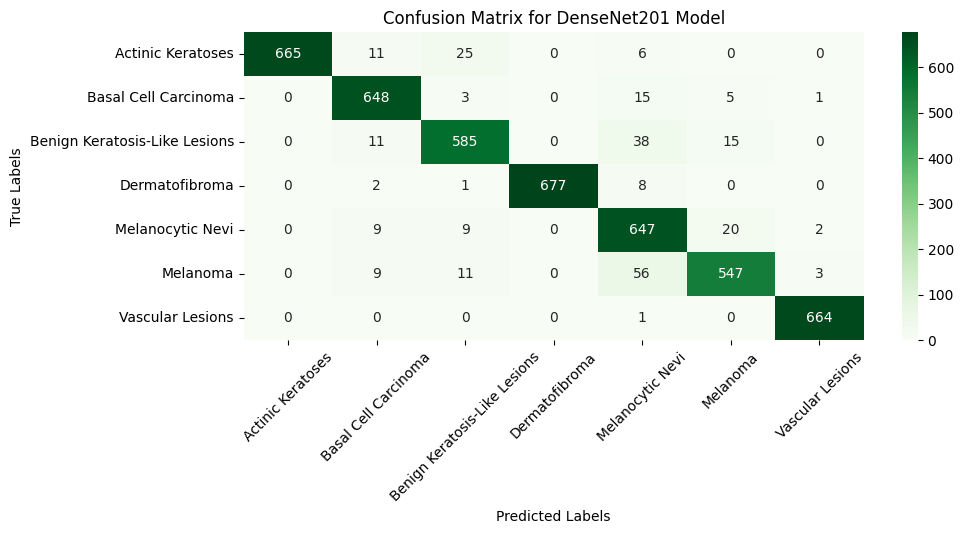

In [137]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes

class_labels = list(test_generator.class_indices.keys())

conf_matrix = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Greens', fmt='d', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for DenseNet201 Model')
plt.xticks(rotation=45)
plt.show()

47/47 ━━━━━━━━━━━━━━━━━━━━ 14s 304ms/step


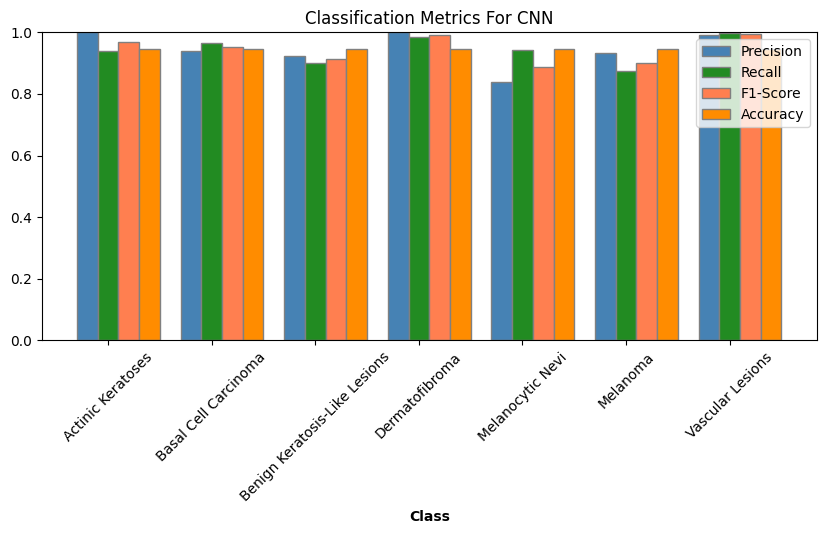

In [138]:
import numpy as np
from sklearn.metrics import classification_report, accuracy_score, precision_recall_fscore_support
import matplotlib.pyplot as plt

predictions = model.predict(test_generator)

predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

precision, recall, f1, _ = precision_recall_fscore_support(true_classes, predicted_classes)

accuracy = [accuracy_score(true_classes, predicted_classes) for _ in range(len(class_labels))]

plt.figure(figsize=(10, 4))

bar_width = 0.2
r1 = np.arange(len(class_labels))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]
r4 = [x + bar_width for x in r3]

plt.bar(r1, precision, color='steelblue', width=bar_width, edgecolor='grey', label='Precision')
plt.bar(r2, recall, color='forestgreen', width=bar_width, edgecolor='grey', label='Recall')
plt.bar(r3, f1, color='coral', width=bar_width, edgecolor='grey', label='F1-Score')
plt.bar(r4, accuracy, color='darkorange', width=bar_width, edgecolor='grey', label='Accuracy')

plt.xlabel('Class', fontweight='bold')
plt.xticks([r + bar_width for r in range(len(class_labels))], class_labels, rotation=45)
plt.title('Classification Metrics For CNN')
plt.legend()
plt.ylim(0, 1)
plt.show()

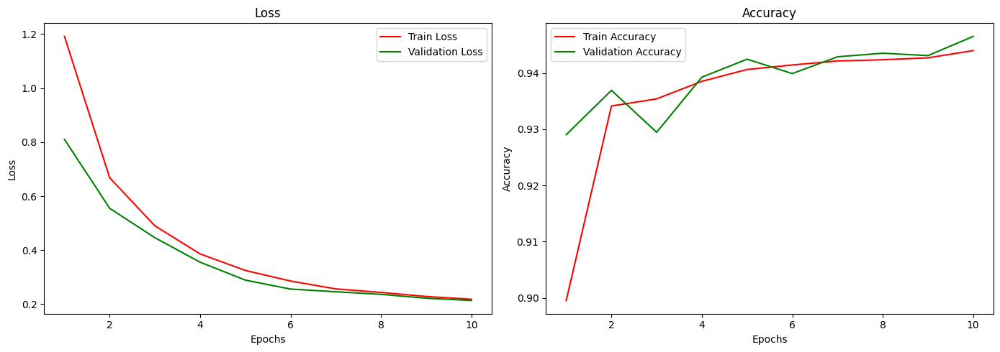

In [139]:
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(tr_acc) + 1)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, tr_loss, 'r', label='Train Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, tr_acc, 'r', label='Train Accuracy')
plt.plot(epochs, val_acc, 'g', label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

     Lesion_Id      Image_Id Diagnosis Confirmation_Method  Age     Sex  \
0  HAM_0001751  ISIC_0024698        nv           consensus   70    male   
1  HAM_0000559  ISIC_0024693        nv           follow_up   45  female   
2  HAM_0004932  ISIC_0032212        nv           follow_up   45  female   
3  HAM_0004516  ISIC_0025775        nv           follow_up   45  female   
4  HAM_0006510  ISIC_0029828        nv           follow_up   55  female   

  Region_Of_Disease Updated_Diagnosis  \
0              face  Melanocytic Nevi   
1   upper extremity  Melanocytic Nevi   
2              foot  Melanocytic Nevi   
3              neck  Melanocytic Nevi   
4   lower extremity  Melanocytic Nevi   

                                          Image_path  Updated_Diagnosis_Label  
0  /kaggle/working/skin-cancer-mnist-ham10000/ISI...                        4  
1  /kaggle/working/skin-cancer-mnist-ham10000/ISI...                        4  
2  /kaggle/working/skin-cancer-mnist-ham10000/ISI...          

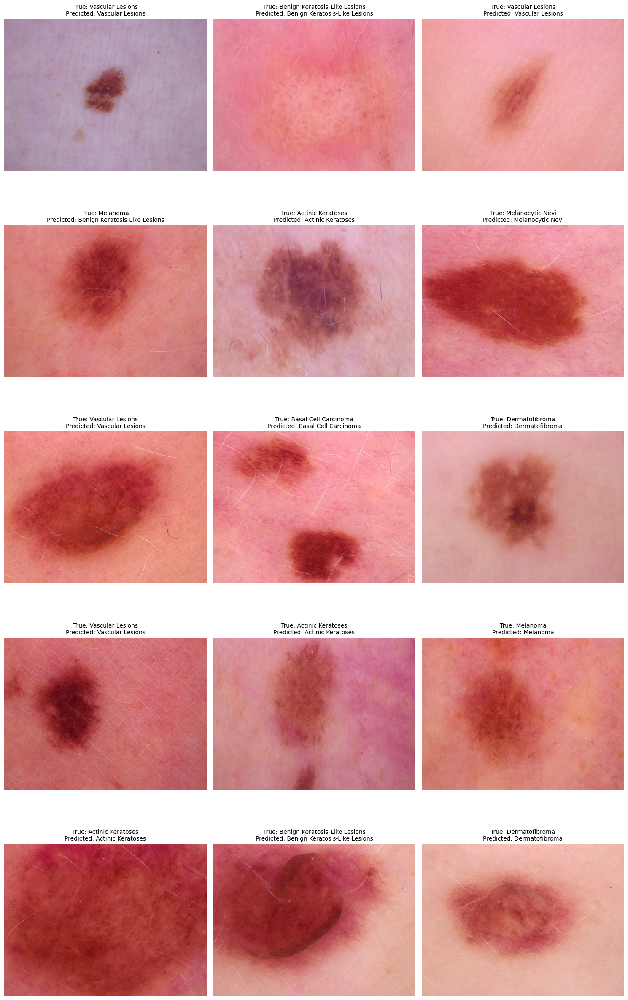

In [140]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

print(meta_data.head())

true_labels = test_generator.classes
predictions = model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

class_labels = list(test_generator.class_indices.keys())

print(f"Length of true_labels: {len(true_labels)}")
print(f"Length of predicted_labels: {len(predicted_labels)}")
print(f"Length of meta_data: {len(meta_data)}")

if len(true_labels) > len(meta_data):
    raise ValueError("The number of true labels exceeds the number of rows in the meta_data DataFrame.")

meta_data = meta_data.iloc[:len(true_labels)]

meta_data['true_label'] = [class_labels[true_labels[i]] for i in range(len(true_labels))]
meta_data['predicted_label'] = [class_labels[predicted_labels[i]] for i in range(len(predicted_labels))]

plt.figure(figsize=(15, 25))
for i in range(15):
    plt.subplot(5, 3, i + 1)
    img = plt.imread(meta_data['Image_path'].iloc[i])
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"True: {meta_data['true_label'].iloc[i]}\nPredicted: {meta_data['predicted_label'].iloc[i]}", fontsize=10)

plt.tight_layout()
plt.show()
